In [129]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, LSTM, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping, CSVLogger
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.utils import to_categorical
import os
import time
import random
import csv
import glob
import numpy as np
from subprocess import call, run
import cv2
import matplotlib.pyplot as plt
import io
import base64
from IPython.display import HTML

### Callbacks 

In [2]:
checkpointer = ModelCheckpoint(
    filepath=os.path.join('data', 'checkpoints', 'end_layer_model.{epoch:03d}-{val_loss:.2f}.hdf5'),
    verbose=1,
    save_best_only=True)

# Helper: Stop when we stop learning.
early_stopper = EarlyStopping(patience=10)

# Helper: TensorBoard
tensorboard = TensorBoard(log_dir=os.path.join('data', 'logs'))

### Classes

In [21]:
classes = ['biking', 'diving', 'golf', 'juggle', 'jumping','riding', 'shooting', 'spiking', 'swing', 'tennis', 'walk_dog']

### Dataset generator

In [3]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    horizontal_flip=True,
    rotation_range=10.,
    width_shift_range=0.2,
    height_shift_range=0.2)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    os.path.join('data', 'train'),
    target_size=(299, 299),
    batch_size=32,
    classes=classes,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    os.path.join('data', 'train'),
    target_size=(299, 299),
    batch_size=32,
    classes = classes,
    class_mode='categorical')

Found 306060 images belonging to 11 classes.
Found 306060 images belonging to 11 classes.


### Base Model

In [4]:
# Helper: Train Inception model with custom classes
base_model = InceptionV3(weights='imagenet', include_top=False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
prediction = Dense(len(classes), activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=prediction)

In [5]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
__________________________________________________________________________________________________
conv2d_1 (

In [6]:
# Freeze all but top
for layer in model.layers[:-2]:
    layer.trainable = False

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [7]:
# Fit Model
model.fit_generator(train_generator, steps_per_epoch=100, validation_data=validation_generator, validation_steps=10,
                   epochs=10, callbacks=[checkpointer, early_stopper, tensorboard])

Epoch 1/10
 99/100 [============================>.] - ETA: 0s - loss: 1.7142 - acc: 0.4403
Epoch 00001: val_loss improved from inf to 0.88100, saving model to data/checkpoints/end_layer_model.001-0.88.hdf5
100/100 [==============================] - 75s 746ms/step - loss: 1.7090 - acc: 0.4419 - val_loss: 0.8810 - val_acc: 0.6844
Epoch 2/10
 99/100 [============================>.] - ETA: 0s - loss: 1.0764 - acc: 0.6575
Epoch 00002: val_loss did not improve from 0.88100
100/100 [==============================] - 56s 556ms/step - loss: 1.0744 - acc: 0.6584 - val_loss: 1.5144 - val_acc: 0.5906
Epoch 3/10
 99/100 [============================>.] - ETA: 0s - loss: 0.8720 - acc: 0.7159
Epoch 00003: val_loss improved from 0.88100 to 0.87511, saving model to data/checkpoints/end_layer_model.003-0.88.hdf5
100/100 [==============================] - 60s 601ms/step - loss: 0.8766 - acc: 0.7147 - val_loss: 0.8751 - val_acc: 0.7188
Epoch 4/10
 99/100 [============================>.] - ETA: 0s - loss: 

In [8]:
# Freeze 1st 172 midlle layer and unfreeze reset
for layer in model.layers[:172]:
    layer.trainable = False
for layer in model.layers[172:]:
    layer.trainable = True

In [9]:
model.compile(
#         optimizer=SGD(lr=0.0001, momentum=0.9),
        optimizer = 'adam',
        loss='categorical_crossentropy',
        metrics=['accuracy', 'top_k_categorical_accuracy'])

In [10]:
model.fit_generator(train_generator, steps_per_epoch=200, validation_data=validation_generator, validation_steps=10,
                   epochs=15, callbacks=[checkpointer, early_stopper, tensorboard])

Epoch 1/15
199/200 [============================>.] - ETA: 0s - loss: 0.5189 - acc: 0.8394 - top_k_categorical_accuracy: 0.9851
Epoch 00001: val_loss did not improve from 0.55932
200/200 [==============================] - 129s 646ms/step - loss: 0.5166 - acc: 0.8402 - top_k_categorical_accuracy: 0.9852 - val_loss: 0.7598 - val_acc: 0.8375 - val_top_k_categorical_accuracy: 0.9938
Epoch 2/15
199/200 [============================>.] - ETA: 0s - loss: 0.2094 - acc: 0.9315 - top_k_categorical_accuracy: 0.9978
Epoch 00002: val_loss did not improve from 0.55932
200/200 [==============================] - 122s 611ms/step - loss: 0.2087 - acc: 0.9319 - top_k_categorical_accuracy: 0.9978 - val_loss: 0.5763 - val_acc: 0.8531 - val_top_k_categorical_accuracy: 0.9969
Epoch 3/15
199/200 [============================>.] - ETA: 0s - loss: 0.1405 - acc: 0.9552 - top_k_categorical_accuracy: 0.9984
Epoch 00003: val_loss improved from 0.55932 to 0.47482, saving model to data/checkpoints/end_layer_model.003

### Main model

In [11]:
model_type = 'lstm'
seq_length = 40
batch_size = 32
nb_epoch = 200
data_type = 'features'
image_shape = None
features_length=2048
max_frames = 300

In [12]:
checkpointer = ModelCheckpoint(
        filepath=os.path.join('data', 'checkpoints', model_type + '-' + data_type + \
            '.{epoch:03d}-{val_loss:.3f}.hdf5'),
        verbose=1,
        save_best_only=True)
tb = TensorBoard(log_dir=os.path.join('data', 'logs', model_type))
early_stopper = EarlyStopping(patience=5)
timestamp = time.time()
csv_logger = CSVLogger(os.path.join('data', 'logs', model_type + '-' + 'training-' + \
        str(timestamp) + '.log'))

In [14]:
# Helper: Read images fromcsv
with open(os.path.join('data', 'data_file.csv'), 'r') as fin:
            reader = csv.reader(fin)
            data = list(reader)

# Helper: Read valid images
data_clean = []
for item in data:
    if int(item[3]) >= seq_length and int(item[3]) <= max_frames \
            and item[1] in classes:
        data_clean.append(item)

In [16]:
len(data_clean)

1470

In [17]:
steps_per_epoch = len(data_clean) * 0.7 // 32
steps_per_epoch

32.0

In [18]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np

def process_image(image, target_shape):
    """Given an image, process it and return the array."""
    # Load the image.
    h, w, _ = target_shape
    image = load_img(image, target_size=(h, w))

    # Turn it into numpy, normalize and return.
    img_arr = img_to_array(image)
    x = (img_arr / 255.).astype(np.float32)

    return x


In [19]:
base_model = Model(inputs=model.input, outputs=model.layers[-3].output)
base_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
__________________________________________________________________________________________________
conv2d_1 (

In [20]:
X, y = [], []
for sample in data:
    # Get frames for sample
    path = os.path.join('data', sample[0], sample[1])
    filename = sample[2]
    images = sorted(glob.glob(os.path.join(path, filename + '*jpg')))

    # rescale list
    if len(images) < seq_length:
        continue
        
    skip = len(images) // seq_length

    output = [images[i] for i in range(0, len(images), skip)]
    output = output[:seq_length]
    
    output = [process_image(x, (299, 299, 3)) for x in output]
    output = np.asarray(output)
    feature = base_model.predict(output)
    X.append(feature)
    
    # For output
    encoded_label = classes.index(sample[1])
    label_hot = to_categorical(encoded_label, len(classes))
    assert len(label_hot) == len(classes)
    
    y.append(label_hot)

In [23]:
X = np.array(X)
y = np.array(y)

In [24]:
metrics = ['accuracy']
if len(classes) >= 10:
    metrics.append('top_k_categorical_accuracy')

In [25]:
input_shape = (seq_length, features_length)
model_2 = Sequential()
model_2.add(LSTM(2048, return_sequences=False, input_shape=input_shape, dropout=0.5))
model_2.add(Dense(512, activation='relu'))
model_2.add(Dropout(0.5))
model_2.add(Dense(len(classes), activation='softmax'))

In [26]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(lr=1e-5, decay=1e-6)
model_2.compile(loss='categorical_crossentropy', optimizer=optimizer,metrics=metrics)

In [27]:
model_2.fit(X,
            y,
            batch_size=batch_size,
            verbose=1,
            callbacks=[tb, early_stopper, csv_logger],
            epochs=nb_epoch)

Epoch 1/200
1595/1595 [==============================] - 45s 28ms/step - loss: 1.9465 - acc: 0.4558 - top_k_categorical_accuracy: 0.8163
Epoch 2/200
1595/1595 [==============================] - 43s 27ms/step - loss: 1.0780 - acc: 0.8890 - top_k_categorical_accuracy: 0.9925
Epoch 3/200
1595/1595 [==============================] - 43s 27ms/step - loss: 0.4861 - acc: 0.9668 - top_k_categorical_accuracy: 1.0000
Epoch 4/200
1595/1595 [==============================] - 44s 27ms/step - loss: 0.2233 - acc: 0.9806 - top_k_categorical_accuracy: 0.9994
Epoch 5/200
1595/1595 [==============================] - 44s 27ms/step - loss: 0.1028 - acc: 0.9887 - top_k_categorical_accuracy: 1.0000
Epoch 6/200
1595/1595 [==============================] - 44s 27ms/step - loss: 0.0610 - acc: 0.9912 - top_k_categorical_accuracy: 1.0000
Epoch 7/200
1595/1595 [==============================] - 44s 27ms/step - loss: 0.0422 - acc: 0.9912 - top_k_categorical_accuracy: 1.0000
Epoch 8/200
1595/1595 [==================

KeyboardInterrupt: 

In [46]:
model_2.save('data/checkpoints/video_analysis_final.hdf5')

### Prediction

In [137]:
def add_label(image, label):
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.putText(img, label, (35, 50), cv2.FONT_HERSHEY_SIMPLEX,1, (0, 255, 0), 2)
    
    image_dir = os.path.dirname(image)
    image_filename = os.path.basename(image)
    image_filename_splitted = image_filename.split('-')
    image_filename_splitted[0] += '-predicted'
    
    filename = os.path.join(image_dir,'-'.join(image_filename_splitted))
    cv2.imwrite(filename, img)

In [138]:
# add_label('/home/eytech/data/examples/ucf11/five-video-classification-methods/data/train/biking/v_biking_12_02-0203.jpg', 'viki')

In [167]:
def play_me(video_path):

    video = io.open(video_path, 'r+b').read()

    encoded = base64.b64encode(video)
    return encoded
#     return HTML(data='''<video alt="test" controls>
#     <source src="data:video/mp4;base64,{0}" type="video/mp4" /> </video>'''.format(encoded.decode('ascii')))

In [161]:
def action_prediction(video_src):
    
    dest_base = '/tmp/predict'
    if not os.path.exists(dest_base):
        os.mkdir(dest_base)

    filename = os.path.basename(video_src).split('.')[0]
    
    # Check frames are already extracted
    if not glob.glob(os.path.join(dest_base, filename + '*.jpg')):
        # Copy video to temp folder
        shutil.copy(video_src, dest_base)
        src = os.path.join(dest_base, os.path.basename(video_src))
        dest = os.path.join(dest_base, filename + '-%04d.jpg')

        # Extract frames from video
        call(["ffmpeg", "-i", src, dest])
    
    # Read images from folder
    images = glob.glob(os.path.join(dest_base, filename + '*.jpg'))
    
    # Group 40 frames as a 1 seq for model input
    test_images_set = []
    for i in range(len(images)//40):
        test_images_set.append(images[i*40: i*40 + 40])
    
    # Extract features from images
    X_pred = []
    for i in range(len(test_images_set)):
        value = [process_image(x, (299, 299, 3)) for x in test_images_set[i]]
        value = np.asarray(value)
        value = base_model.predict(value)
        X_pred.append(value)
    
    X_pred = np.asarray(X_pred)
    
    # Predict the action
    y_pred = model_2.predict(X_pred)
    y_pred = [classes[i] for i in y_pred.argmax(axis=1)]
    
    # Add label to the Frames
    for idx, image_set in enumerate(test_images_set):
        for image in image_set:
            add_label(image, 'Action:' + y_pred[idx])
    
    # Merge all frames
    predicted_images = os.path.join(dest_base, filename +"-predicted-%04d.jpg")
    video_name = os.path.join(dest_base, filename +"-predicted.mp4")

    call(["ffmpeg", "-i", predicted_images, video_name])
    print("Predicted Video: ", video_name)

In [162]:
action_prediction('data/test/sample2.mp4')

Predicted Video:  /tmp/predict/sample2-predicted.mp4


In [166]:
enc = play_me('/tmp/predict/sample2-predicted.mp4')
HTML(data='''<video alt="test" controls>
    <source src="data:video/mp4;base64,{0}" type="video/mp4" /> </video>'''.format(enc.decode('ascii')))

### Add text to image

In [18]:
import cv2
import matplotlib.pyplot as plt

In [34]:
def add_label(image):
    font = cv2.FONT_HERSHEY_SIMPLEX
    bottomLeftCornerOfText = (100, 100)
    fontScale = 1
    fontColor = (255, 0, 0)
    lineType = 2

#     img = cv2.imread('/home/eytech/data/examples/ucf11/five-video-classification-methods/data/train/biking/v_biking_12_02-0203.jpg')
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # cv2.putText(img, 'Gayathri Vignesh!', bottomLeftCornerOfText, font, fontScale, lineType)
    cv2.putText(img, 'Gayathri Vignesh!', (35, 50), cv2.FONT_HERSHEY_SIMPLEX,1, (0, 255, 0), 2)

array([[[ 97,  93,  81],
        [ 97,  93,  81],
        [ 97,  93,  81],
        ...,
        [ 84,  77,  49],
        [ 84,  77,  49],
        [ 84,  77,  49]],

       [[ 97,  93,  81],
        [ 97,  93,  81],
        [ 97,  93,  81],
        ...,
        [ 84,  77,  49],
        [ 84,  77,  49],
        [ 84,  77,  49]],

       [[ 97,  93,  81],
        [ 97,  93,  81],
        [ 97,  93,  81],
        ...,
        [ 84,  77,  49],
        [ 84,  77,  49],
        [ 84,  77,  49]],

       ...,

       [[125, 125, 125],
        [125, 125, 125],
        [125, 125, 125],
        ...,
        [ 97, 104,  97],
        [102, 109, 102],
        [104, 111, 104]],

       [[125, 125, 125],
        [125, 125, 125],
        [125, 125, 125],
        ...,
        [ 97, 104,  97],
        [102, 109, 102],
        [104, 111, 104]],

       [[125, 125, 125],
        [125, 125, 125],
        [125, 125, 125],
        ...,
        [ 97, 104,  97],
        [102, 109, 102],
        [104, 111, 104]]

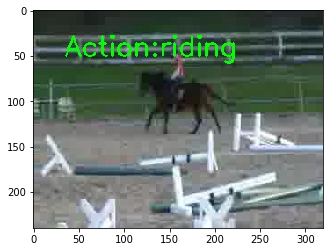

In [110]:
img = cv2.imread('/tmp/predict/sample1-1021-predicted.jpg')
plt.imshow(img)